In [1]:
import os
import pandas as pd
import numpy as np
import pickle

In [2]:
df = pd.read_csv("../Data_Scrape/Dataset/updated_dataset.csv")
df.head()

,sp_song_id,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,...,lda_topic_11,lda_topic_12,lda_topic_13,lda_topic_14,lda_topic_15,lda_topic_16,lda_topic_17,lda_topic_18,lda_topic_19,Playlists
0,6edQfeOlqbGteYixpJl3Sm,0.857,0.602,10,-8.311,1,0.0290,0.489000,0.02440,0.3170,...,0.0,0.022993,0.000000,0.122078,0.0,0.000000,0.000000,0.081108,0.386042,[165]
1,5Oe7wHPL4hdEXeF4AOayCi,0.322,0.990,8,-1.785,1,0.1710,0.000044,0.41700,0.0366,...,0.0,0.000000,0.163142,0.022999,0.0,0.144614,0.187207,0.000000,0.000000,[79]
2,6i1uWZYWabNHq2wQnoca58,0.666,0.884,9,-5.243,0,0.0429,0.506000,0.00612,0.0408,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.582131,[15]
3,4BzBtS6PBreni5hNPo2hos,0.609,0.578,9,-7.081,1,0.0414,0.296000,0.00000,0.1500,...,0.0,0.000000,0.511716,0.084905,0.0,0.000000,0.000000,0.115004,0.108140,[168]
4,0GvhHQbWSnGltjl0je61dI,0.699,0.514,4,-12.610,1,0.0315,0.587000,0.02900,0.2200,...,0.0,0.000000,0.000000,0.401954,0.0,0.000000,0.000000,0.000000,0.000000,"[30, 133]"


In [3]:
print(df["Playlists"])


0                 [165]
1                  [79]
2                  [15]
3                 [168]
4             [30, 133]
              ...      
11156             [103]
11157              [72]
11158         [55, 127]
11159    [68, 113, 132]
11160              [19]
Name: Playlists, Length: 11161, dtype: object


In [4]:
df.isna().sum()

sp_song_id          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
release_date        0
popularity          0
lda_topic_0         0
lda_topic_1         0
lda_topic_2         0
lda_topic_3         0
lda_topic_4         0
lda_topic_5         0
lda_topic_6         0
lda_topic_7         0
lda_topic_8         0
lda_topic_9         0
lda_topic_10        0
lda_topic_11        0
lda_topic_12        0
lda_topic_13        0
lda_topic_14        0
lda_topic_15        0
lda_topic_16        0
lda_topic_17        0
lda_topic_18        0
lda_topic_19        0
Playlists           0
dtype: int64

In [5]:
"""Making the word cloud of the lyrical dataset"""

'Making the word cloud of the lyrical dataset'

In [76]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

In [77]:
full_word_list = open("../Data_Scrape/Dataset/full_word_list.txt", encoding="utf8")

In [78]:
from nltk.corpus import stopwords 

In [79]:
stop_words = []
languages_list = ['english', 'spanish', 'german', 'french', 'italian']
for language in languages_list:
    stop_words.extend(stopwords.words(language))

from nltk.stem import PorterStemmer 
ps = PorterStemmer() 

stop_words = [ps.stem(w) for w in stop_words]

In [80]:
freq_dict = {}
for i in full_word_list:
    try:
        line = i.split("<SEP>")
        line[-1] = line[-1][:-1]
        if(line[0] not in stop_words):
            freq_dict[line[0]] = int(line[1])
    except:
        print(i)

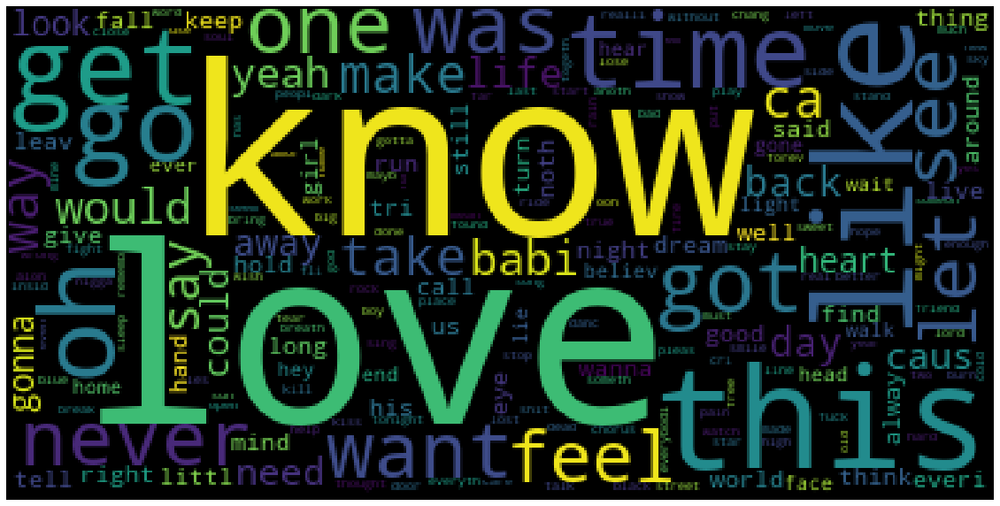

In [98]:
wordcloud = WordCloud()
wordcloud.generate_from_frequencies(frequencies=freq_dict)
plt.figure(figsize=(20,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


In [88]:
print(df.corr())

                  danceability    energy       key  loudness      mode  \
danceability          1.000000 -0.143391  0.023831 -0.081043 -0.061631   
energy               -0.143391  1.000000  0.005815  0.738415 -0.088221   
key                   0.023831  0.005815  1.000000 -0.005671 -0.138629   
loudness             -0.081043  0.738415 -0.005671  1.000000 -0.061168   
mode                 -0.061631 -0.088221 -0.138629 -0.061168  1.000000   
speechiness           0.133142  0.209740  0.048390  0.152500 -0.115247   
acousticness          0.026037 -0.668034 -0.010435 -0.470381  0.107987   
instrumentalness     -0.195703  0.123859 -0.003533 -0.018972 -0.012181   
liveness             -0.123500  0.149732 -0.006209  0.085309  0.006358   
valence               0.546982  0.102416  0.021603 -0.021900  0.000841   
tempo                -0.265157  0.164481 -0.014080  0.103465  0.023500   
duration_ms          -0.084830  0.035984  0.006464 -0.025494 -0.090789   
popularity            0.150990 -0.0502

In [89]:
import seaborn as sns


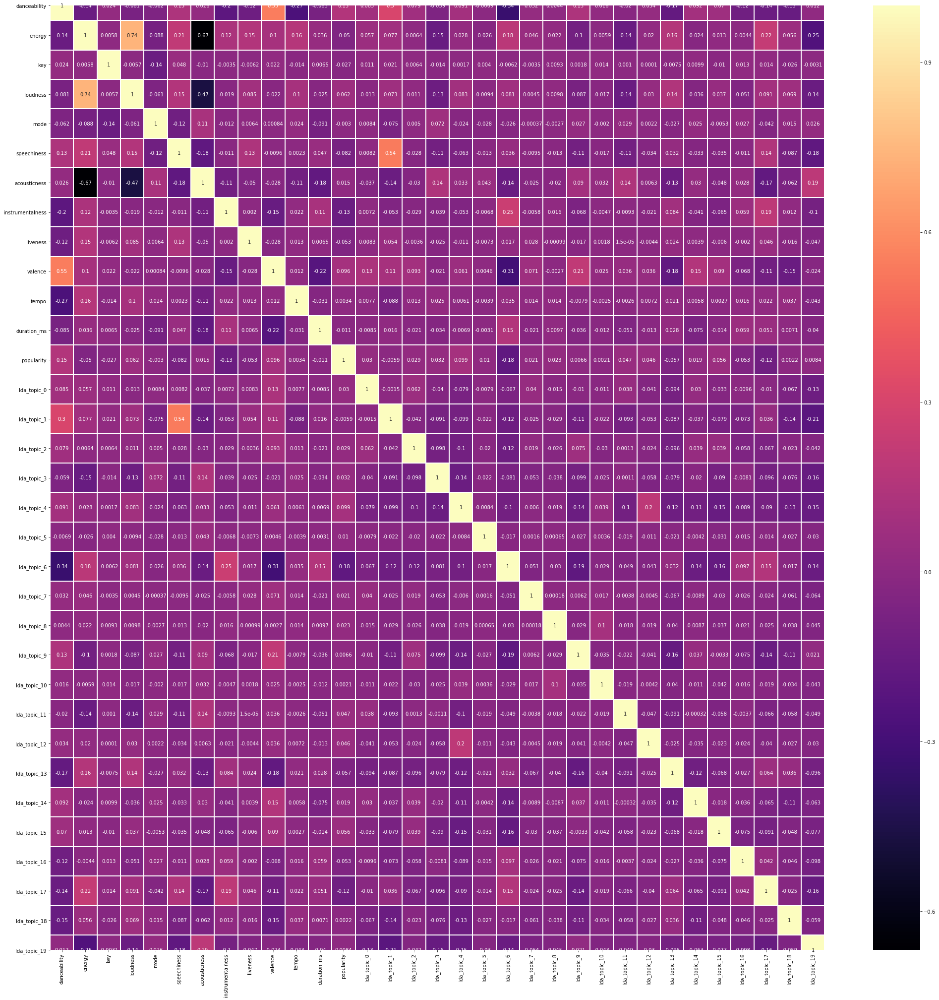

In [95]:
fig, ax = plt.subplots(figsize=(35,35))
sns.heatmap(df.corr(),linecolor='white',linewidths=1,cmap='magma',annot=True)


In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11161 entries, 0 to 11160
Data columns (total 36 columns):
sp_song_id          11161 non-null object
danceability        11161 non-null float64
energy              11161 non-null float64
key                 11161 non-null int64
loudness            11161 non-null float64
mode                11161 non-null int64
speechiness         11161 non-null float64
acousticness        11161 non-null float64
instrumentalness    11161 non-null float64
liveness            11161 non-null float64
valence             11161 non-null float64
tempo               11161 non-null float64
duration_ms         11161 non-null int64
release_date        11161 non-null object
popularity          11161 non-null int64
lda_topic_0         11161 non-null float64
lda_topic_1         11161 non-null float64
lda_topic_2         11161 non-null float64
lda_topic_3         11161 non-null float64
lda_topic_4         11161 non-null float64
lda_topic_5         11161 non-null float6

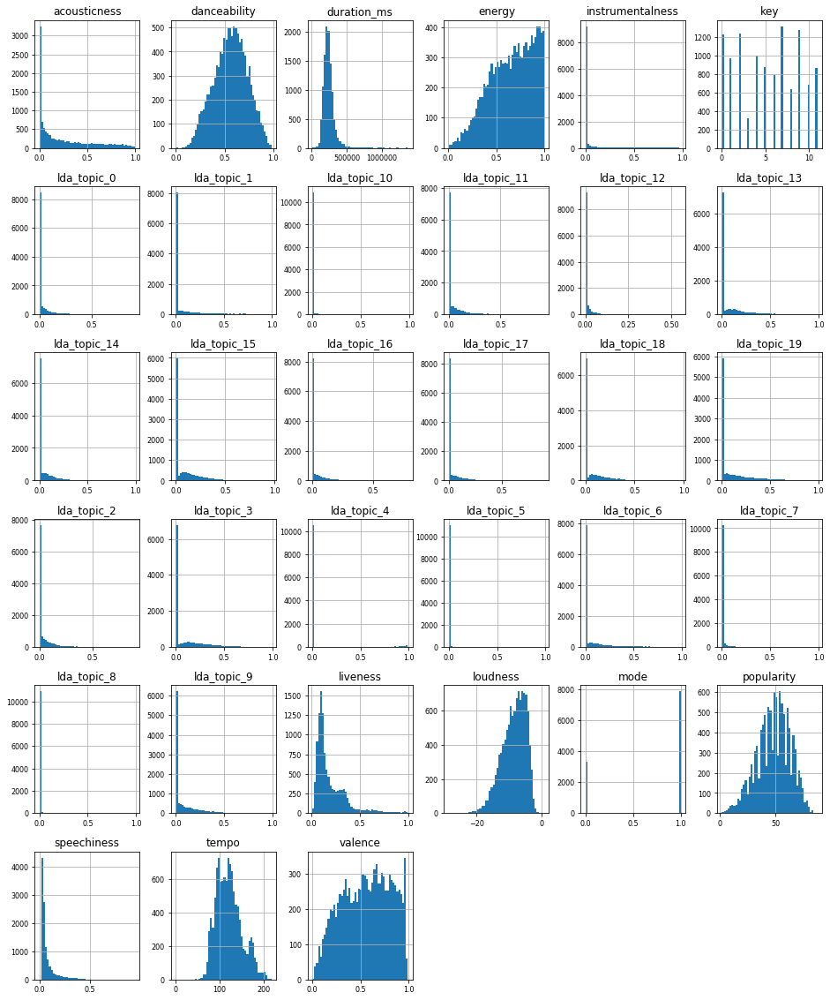

In [100]:
df.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

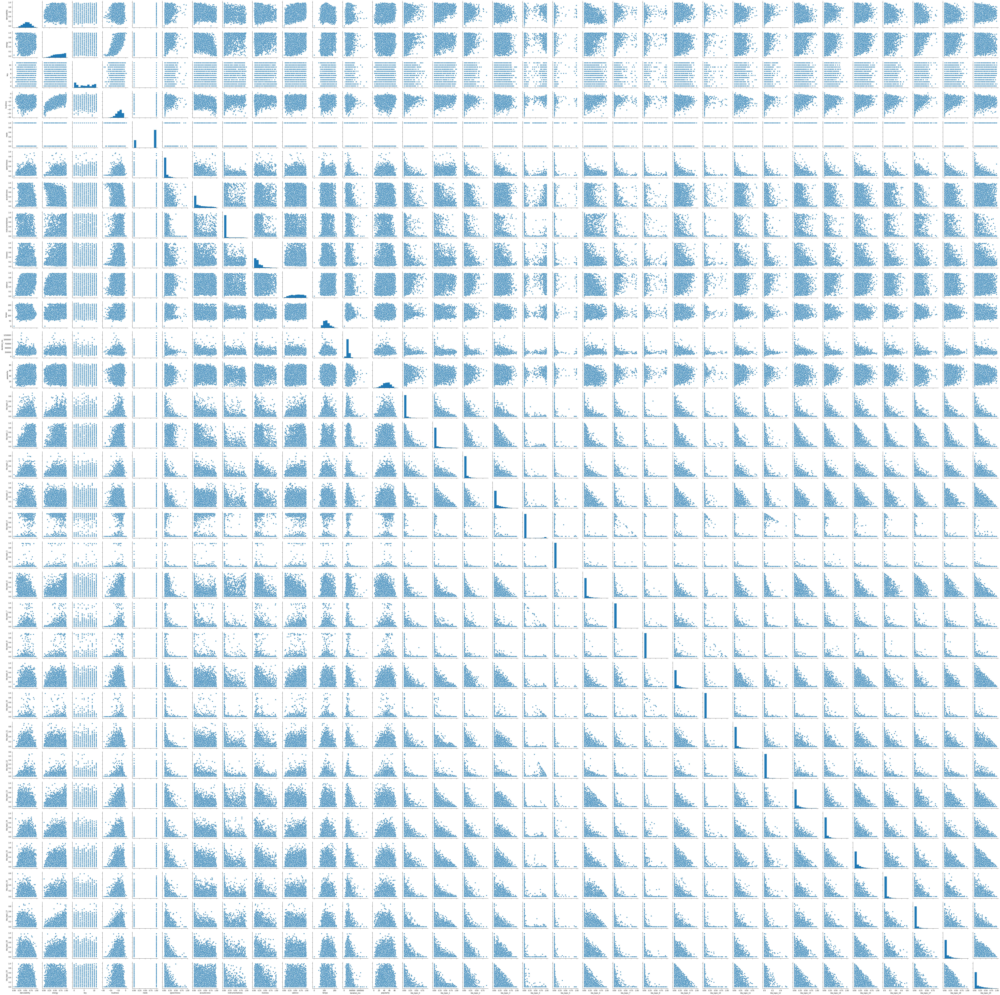

In [101]:
sns.pairplot(df,diag_kind="hist")


In [113]:
df_orig  = df.iloc[:, 1:15]

In [114]:
df_orig.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,release_date,popularity
0,0.857,0.602,10,-8.311,1,0.0290,0.489000,0.02440,0.3170,0.957,105.157,239627,3/1/1999,48
1,0.322,0.990,8,-1.785,1,0.1710,0.000044,0.41700,0.0366,0.146,104.678,210867,1/1/2006,44
2,0.666,0.884,9,-5.243,0,0.0429,0.506000,0.00612,0.0408,0.754,92.005,298573,1989,54
3,0.609,0.578,9,-7.081,1,0.0414,0.296000,0.00000,0.1500,0.343,123.925,233947,2006,19
4,0.699,0.514,4,-12.610,1,0.0315,0.587000,0.02900,0.2200,0.630,120.758,144947,1/23/1959,53


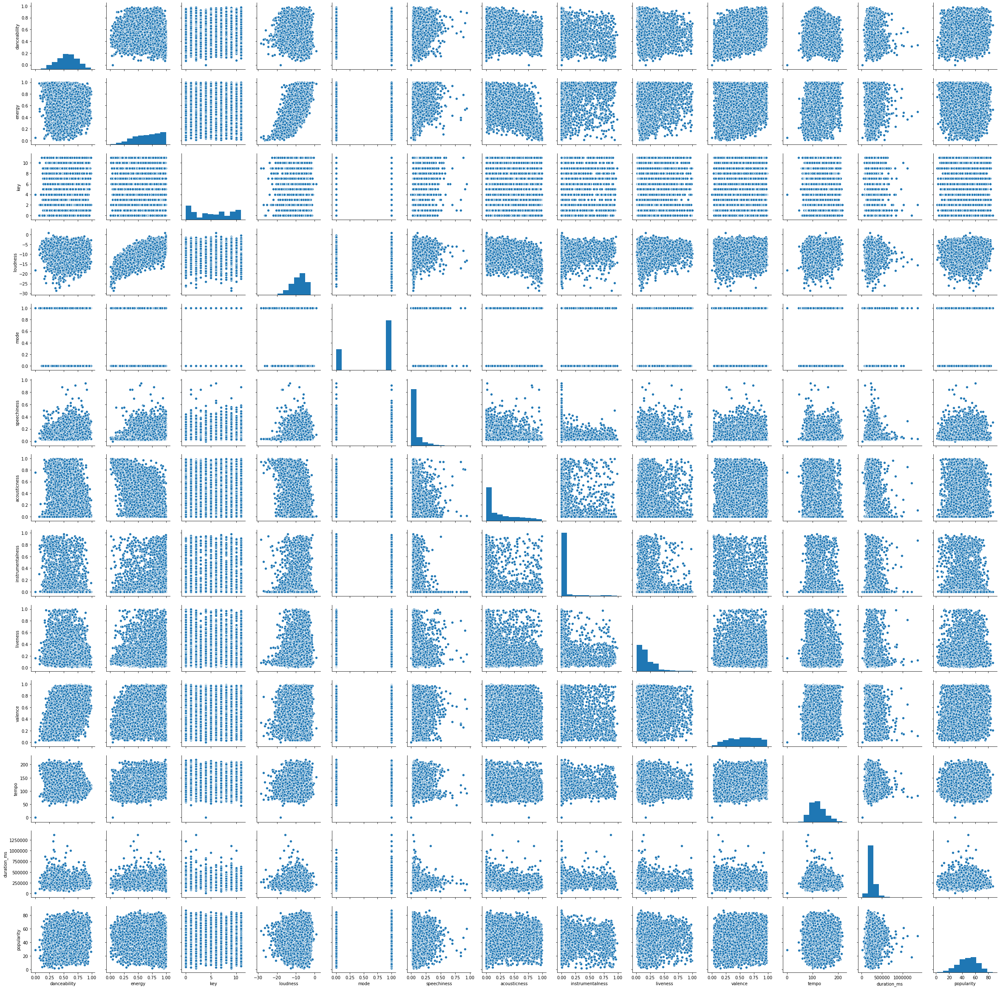

In [115]:
sns.pairplot(df_orig,diag_kind="hist")
